In [86]:
import pandas as pd 
import jieba.posseg as psg
pd.set_option('display.max_rows',None)

# 读取数据

In [87]:
df = pd.read_excel('../data/package.xlsx')
df = df[~df['package'].isnull()]
df.head()

,package,download,describe
0,soupsieve,23386593.0,[![Donate via PayPal][donate-image]][donate-li...
1,poetry_core,0.0,# Poetry Core\n[![PyPI version](https://img.sh...
2,triangle,57668.0,NaN
3,pytinyexr,985.0,# PyEXR\n\n[![Build Status](https://travis-ci....
4,llspy,375.0,##############################################...


# 清洗数据

## 下载量降序排序

In [88]:
# 按下载量降序
df['download'] = df['download'].astype(int)
df = df.sort_values(by='download',ascending=False)
df.head()

,package,download,describe
1304,botocore,202180237,botocore\n========\n\n.. image:: https://codec...
431,setuptools,201956950,.. image:: https://raw.githubusercontent.com/p...
144,urllib3,183695441,"\nurllib3 is a powerful, *user-friendly* HTTP ..."
1582,boto3,179664367,===============================\nBoto3 - The A...
642,s3transfer,168808960,==============================================...


## 分词，统计词数

In [89]:
# 把每条评论分词，并标注每个词的词性
df['describe'] = df['describe'].astype(str)
worker = lambda s: [(x.word,x.flag) for x in psg.cut(s)] # 自定义简单分词函数
seg_word = df['describe'].apply(worker)
seg_word.head()

1304    [(botocore, eng), (\n, x), (=, x), (=, x), (=,...
431     [(.., m), ( , x), (image, eng), (:, x), (:, x)...
144     [(\n, x), (urllib3, eng), ( , x), (is, eng), (...
1582    [(=, x), (=, x), (=, x), (=, x), (=, x), (=, x...
642     [(=, x), (=, x), (=, x), (=, x), (=, x), (=, x...
Name: describe, dtype: object

In [90]:
# 剔除中文
df['describe'] = df['describe'].str.replace(r'[^\x00-\x7F]+', '')

# 每一条描述中的词的个数
n_word = seg_word.apply(lambda x: len(x))

# 把每条描述的 id 弄成列表，例如第一条描述 id 为 1，有 3 个分词，第二条描述 id 为 2，
# 两个分词，那结果：[[1,1,1],[2,2]] 以此类推
n_content = [[x+1]*y for x,y in zip(list(seg_word.index),list(n_word))]
index_content = sum(n_content,[]) # 将嵌套列表展开，作为词所在描述 id

seg_word = sum(seg_word,[]) # 列表。形式：[(词，词性)....]
word = [x[0] for x in seg_word] # 词
nature = [x[1] for x in seg_word] # 词性

# 转为数据框，第一列为词所在评论id，第二列词语，第三列词性
result = pd.DataFrame({'index_content':index_content,
                       'word':word,
                       'nature':nature,
                       })

# 词性为 x，代表标点符号
# m：数词
result = result[(result['nature'] != 'x') &
                (result['nature'] != 'm') 
               ]
result.head()

D:\programming\dev_env\anaconda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


,index_content,word,nature
0,1305,botocore,eng
14,1305,image,eng
18,1305,https,eng
22,1305,codecov,eng
24,1305,io,eng


In [91]:
# 统计词数
result['word'] = result['word'].str.lower()
count = result.value_counts('word').reset_index()
count

,word,0
0,the,32297
1,to,19888
2,https,18138
3,and,15788
4,python,13039
5,of,12467
6,for,12256
7,is,11362
8,in,11189
9,com,9917


In [92]:
# 剔除一些词
def filters(s):
    word = ['the','to','https','and','python','of','for','is','in',
           'github','with','you','org','com','on','this','be','from',
           'as','it','or','can','that','code','are','if','by','version',
           'use','an','import','not','will','using','pip','install',
            'your','when','all','pypi','py','which','have','www'
           ]
    if s in word:
        return 1
    else:
        return 0
count['flag'] = count['word'].map(filters)
count = count[count['flag'] == 0]
count

,word,0,flag
24,io,4544,0
29,http,3727,0
33,image,3353,0
35,svg,2992,0
38,data,2920,0
40,file,2734,0
41,support,2706,0
45,html,2278,0
46,target,2247,0
47,img,2167,0


# 可视化 

## 词云图

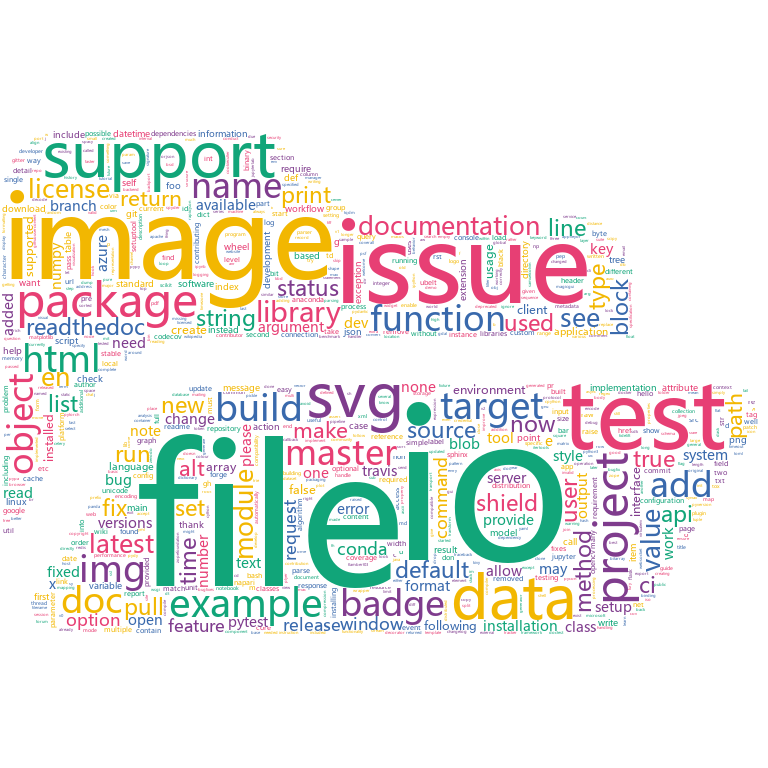

In [93]:
from IPython.display import Image 
import stylecloud


# 把词连在一起
text = ''
for i,j in list(zip(count['word'],count[0])):
    for k in range(j):
        text += i + ' ' 

stylecloud.gen_stylecloud(
    text=text,
    collocations=False,
    font_path=r'‪C:\Windows\Fonts\msyh.ttc',
    icon_name='fas fa-folder-open',
    size=768,
    output_name='../output/词云图.png'
)

Image(filename='../output/词云图.png')

## 条形图

In [105]:
import pyecharts.options as opts
from pyecharts.charts import WordCloud
from pyecharts.globals import SymbolType

data = list(zip(df['package'],df['download']))

c = (
    WordCloud()
    .add(series_name="", data_pair=data, 
         word_size_range=[6, 66],shape=SymbolType.DIAMOND)
    .set_global_opts(
        title_opts=opts.TitleOpts(
            title="", title_textstyle_opts=opts.TextStyleOpts(font_size=23)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=True),
    )
)
c.render('../output/package.html')
c.render_notebook()